<a href="https://colab.research.google.com/github/templar137/AI_project/blob/main/automl_feature_selection_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install catboost

     |████████████████████████████████| 69.2MB 72kB/s 


In [ ]:
pip install xgboost

In [ ]:
pip install pycaret[full]

In [6]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [12]:
import pandas as pd
import numpy as np
from pycaret.classification import *
from sklearn.metrics import log_loss

# 전처리
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
import random

# 모델
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from tensorflow import keras

# 시각화 툴
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

pd.options.mode.chained_assignment = None

In [8]:
x_train_path = '/content/train.csv'
y_train_path = '/content/train_label.csv'
x_test_path = '/content/test.csv'

x_train = pd.read_csv(x_train_path)
x_test = pd.read_csv(x_test_path)
y_train = pd.read_csv(y_train_path)

# 이메일당 라벨 부여하는 코드
for i in range(0, len(x_train.iloc[:, 1])):
    for j in range(0, len(y_train.iloc[:, 1])):
        if x_train.iloc[i, 0] == y_train.iloc[j, 0]:
            x_train.loc[i, 'diag_NM'] = y_train.iloc[j, 1]

In [9]:
x_train_org = pd.read_csv(x_train_path)
x_test_org = pd.read_csv(x_test_path)

In [ ]:
x_train = pd.read_csv(x_train_path)
x_test = pd.read_csv(x_test_path)
x_train_org = pd.read_csv(x_train_path)
x_test_org = pd.read_csv(x_test_path)


# 불필요한 컬럼 제거 작업 'EMAIL',
drop = ['summary_date', 'EMAIL','activity_class_5min','activity_met_1min', 'sleep_hr_5min', 'sleep_hypnogram_5min',
        'sleep_is_longest', 'sleep_rmssd_5min', 'timezone', 'sleep_total','sleep_temperature_trend_deviation', 
        'CONVERT(activity_class_5min USING utf8)','CONVERT(activity_met_1min USING utf8)', 'CONVERT(sleep_hr_5min USING utf8)',
        'CONVERT(sleep_hypnogram_5min USING utf8)','CONVERT(sleep_rmssd_5min USING utf8)','activity_average_met', 'activity_cal_active', 'activity_cal_total','activity_steps', 'activity_score',
        'activity_score_move_every_hour', 'activity_daily_movement','activity_met_min_high',
        'activity_score_stay_active', 'activity_total', 'activity_met_min_low','activity_medium',
        'activity_score_training_frequency','activity_steps', 'activity_score',
        'activity_score_training_volume','sleep_efficiency','sleep_duration','sleep_hr_lowest',
        'sleep_midpoint_time','sleep_awake','sleep_deep','sleep_rem','sleep_restless','sleep_temperature_delta',
        'sleep_score_total','sleep_score','activity_score_meet_daily_targets','sleep_period_id','activity_inactivity_alerts',
        'activity_score_recovery_time','sleep_score_latency', 'sleep_score_alignment', 'sleep_score_efficiency']
x_train = x_train.drop(columns = drop)
test_email = x_test['EMAIL']
x_test = x_test.drop(columns = drop)


# month 추가
for i in range (0,len(x_train_org.iloc[:,1])):
  date = x_train_org['summary_date']
  temp = date[i].split('-')
  x_train.loc[i,'month'] = temp[1]
  
for i in range (0,len(x_test_org.iloc[:,1])):
  date = x_test_org['summary_date']
  temp = date[i].split('-')
  x_test.loc[i,'month'] = temp[1]

# 시계열 자료 수치화 보조 함수
def sumsquare_exp(llist):
  sum = 0
  #j = 2
  for i in llist:
    sum += np.exp(i)
  return sum
def sumsquare(llist):
  sum = 0
  j = 3
  for i in llist:
    sum = sum + i ** j # i 의 j제곱
  return sum
def interpolate(x):
    temp = x.split('/')[:-1]
    temp = pd.to_numeric(temp)
    temp = pd.Series(temp).astype('float').replace(0., np.NaN).interpolate().tolist()
    temp = [x for x in temp if np.isnan(x) == False]
    return temp 
## convert new features 추가
convert_low = ['CONVERT(activity_met_1min USING utf8)']
convert = ['CONVERT(sleep_hypnogram_5min USING utf8)']
for i in convert_low:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare_exp(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare_exp(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])
for i in convert:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])

### 이게 2번째인데 F1 score은 가장 좋지만 예측 증상자 수가 좀 낮게 나와서 class imbalance문제를 좀 받는 데이터셋입니다. 정배쪽으로 보시면 좋을 것 같습니다.

In [ ]:
drop = ['summary_date', 'EMAIL','activity_class_5min','activity_met_1min', 'sleep_hr_5min', 'sleep_hypnogram_5min',
        'sleep_is_longest', 'sleep_rmssd_5min', 'timezone', 'sleep_total','sleep_temperature_trend_deviation', 
        'CONVERT(activity_class_5min USING utf8)','CONVERT(activity_met_1min USING utf8)', 'CONVERT(sleep_hr_5min USING utf8)',
        'CONVERT(sleep_hypnogram_5min USING utf8)','CONVERT(sleep_rmssd_5min USING utf8)','activity_average_met', 'activity_cal_active', 'activity_cal_total','activity_steps', 'activity_score',
        'activity_score_move_every_hour', 'activity_daily_movement','activity_met_min_high',
        'activity_score_stay_active', 'activity_total', 'activity_met_min_low','activity_medium',
        'activity_score_training_frequency','activity_steps', 'activity_score',
        'activity_score_training_volume','sleep_efficiency','sleep_duration','sleep_hr_lowest',
        'sleep_midpoint_time','sleep_awake','sleep_deep','sleep_rem','sleep_restless','sleep_temperature_delta',
        'sleep_score_total','sleep_score','activity_score_meet_daily_targets','activity_inactivity_alerts',
        'activity_score_recovery_time','sleep_score_latency', 'sleep_score_alignment', 'sleep_score_efficiency', 'activity_high',
        'sleep_onset_latency', 'activity_non_wear', 'sleep_temperature_deviation']

x_train = pd.read_csv(x_train_path)
x_test = pd.read_csv(x_test_path)
x_train_org = pd.read_csv(x_train_path)
x_test_org = pd.read_csv(x_test_path)
x_train = x_train.drop(columns = drop)
test_email = x_test['EMAIL']
x_test = x_test.drop(columns = drop)

# 폐기 존나구리다 중지 다시 평균으로감
x_train_org['sleep_deep'][x_train_org['sleep_deep'] == 0] = 1
x_test_org['sleep_deep'][x_test_org['sleep_deep'] == 0] = 1


x_train['sleep_deep'] = np.log(x_train_org['sleep_deep'])
x_test['sleep_deep'] = np.log(x_test_org['sleep_deep'])
# 기존 데이터 재설정
x_train['sleep_restless'] = x_train_org['sleep_restless'] / np.log(x_train_org['sleep_duration'])
x_test['sleep_restless'] = x_test_org['sleep_restless'] / np.log(x_test_org['sleep_duration'])
# 엄청 좋은 발견인것 같다.

# month 추가
for i in range (0,len(x_train_org.iloc[:,1])):
  date = x_train_org['summary_date']
  temp = date[i].split('-')
  x_train.loc[i,'month'] = temp[1]
  
for i in range (0,len(x_test_org.iloc[:,1])):
  date = x_test_org['summary_date']
  temp = date[i].split('-')
  x_test.loc[i,'month'] = temp[1]

# 시계열 자료 수치화 보조 함수
def sumsquare_exp(llist):
  sum = 0
  #j = 2
  for i in llist:
    sum += np.exp(i)
  return sum
def sumsquare(llist):
  sum = 0
  j = 3
  for i in llist:
    sum = sum + i ** j # i 의 j제곱
  return sum
def interpolate(x):
    temp = x.split('/')[:-1]
    temp = pd.to_numeric(temp)
    temp = pd.Series(temp).astype('float').replace(0., np.NaN).interpolate().tolist()
    temp = [x for x in temp if np.isnan(x) == False]
    return temp 
## convert new features 추가
convert_low = ['CONVERT(activity_met_1min USING utf8)']
convert = ['CONVERT(sleep_hypnogram_5min USING utf8)']
for i in convert_low:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare_exp(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare_exp(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])
for i in convert:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])

### 이게 2번째인데 F1 score은 안좋게 나오지만 증상자를 좀 더 많이 잡아내는 데이터셋으로 나와서 저는 개인적으로 유망주형 데이터셋인 것 같습니다.

In [14]:
# 이메일당 라벨 부여하는 코드
for i in range(0, len(x_train.iloc[:, 1])):
    for j in range(0, len(y_train.iloc[:, 1])):
        if x_train.iloc[i, 0] == y_train.iloc[j, 0]:
            x_train.loc[i, 'diag_NM'] = y_train.iloc[j, 1]

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_alignment,sleep_score_deep,sleep_score_disturbances,sleep_score_efficiency,sleep_score_latency,sleep_score_rem,sleep_temperature_deviation,diag_NM
0,0,417,545,7,160,32,399,16.500,70.53,15030,6693,960,20,100,41,50,27,97,66,-0.12,CN
1,0,473,392,8,24,29,538,17.375,68.01,12210,10495,690,19,100,49,43,46,91,35,-0.32,CN
2,0,586,362,14,76,9,459,17.000,64.89,15780,5439,1140,26,100,56,47,34,89,41,0.07,CN
3,0,176,34,1,3,19,1210,17.250,63.70,16350,7241,1170,30,100,35,40,44,86,29,-0.41,CN
4,0,646,377,15,19,19,392,17.250,67.07,14010,6037,3360,23,100,64,55,39,14,54,-0.27,CN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,3,735,155,11,57,0,530,16.250,60.21,18210,8734,810,29,100,53,46,74,97,84,-0.16,CN
9323,1,780,167,10,82,0,470,15.875,63.75,19320,8017,450,18,100,34,57,76,81,95,-0.09,CN
9324,1,518,332,7,198,0,528,16.125,67.40,16140,10129,600,15,100,1,56,69,86,89,0.41,CN
9325,4,578,173,8,107,0,655,15.625,64.84,22170,10630,1140,17,100,9,59,86,89,98,0.27,CN


In [11]:
#activity_score_meet_daily_target
#sleep_period
#activity_inactiviy_alert
#activity_score_recovery_time
#=>위 추가 drop by feature selection


x_train = x_train.drop(columns = ['activity_average_met', 'activity_cal_active', 'activity_cal_total','activity_steps', 'activity_score',
                                    'activity_score_move_every_hour', 'activity_daily_movement','activity_met_min_high',
                                    'activity_score_stay_active', 'activity_total', 'activity_met_min_low','activity_medium',
                                    'activity_score_training_frequency','activity_steps', 'activity_score',
                                    'activity_score_training_volume','sleep_efficiency','sleep_duration','sleep_hr_lowest',
                                    'sleep_midpoint_time','sleep_awake','sleep_deep','sleep_rem','sleep_restless','sleep_temperature_delta',
                                    'sleep_score_total','sleep_score','activity_score_meet_daily_targets','sleep_period_id','activity_inactivity_alerts',
                                  'activity_score_recovery_time'])

x_test = x_test.drop(columns = ['activity_average_met', 'activity_cal_active', 'activity_cal_total','activity_steps', 'activity_score',
                                    'activity_score_move_every_hour', 'activity_daily_movement','activity_met_min_high',
                                    'activity_score_stay_active', 'activity_total', 'activity_met_min_low','activity_medium',
                                    'activity_score_training_frequency','activity_steps', 'activity_score',
                                    'activity_score_training_volume','sleep_efficiency','sleep_duration','sleep_hr_lowest',
                                    'sleep_midpoint_time','sleep_awake','sleep_deep','sleep_rem','sleep_restless','sleep_temperature_delta',
                                    'sleep_score_total','sleep_score','activity_score_meet_daily_targets','sleep_period_id','activity_inactivity_alerts',
                                  'activity_score_recovery_time'])



In [ ]:
x_train

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_alignment,sleep_score_deep,sleep_score_disturbances,sleep_score_efficiency,sleep_score_latency,sleep_score_rem,sleep_temperature_deviation,diag_NM
0,0,417,545,7,160,32,399,16.500,70.53,15030,6693,960,20,100,41,50,27,97,66,-0.12,CN
1,0,473,392,8,24,29,538,17.375,68.01,12210,10495,690,19,100,49,43,46,91,35,-0.32,CN
2,0,586,362,14,76,9,459,17.000,64.89,15780,5439,1140,26,100,56,47,34,89,41,0.07,CN
3,0,176,34,1,3,19,1210,17.250,63.70,16350,7241,1170,30,100,35,40,44,86,29,-0.41,CN
4,0,646,377,15,19,19,392,17.250,67.07,14010,6037,3360,23,100,64,55,39,14,54,-0.27,CN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,3,735,155,11,57,0,530,16.250,60.21,18210,8734,810,29,100,53,46,74,97,84,-0.16,CN
9323,1,780,167,10,82,0,470,15.875,63.75,19320,8017,450,18,100,34,57,76,81,95,-0.09,CN
9324,1,518,332,7,198,0,528,16.125,67.40,16140,10129,600,15,100,1,56,69,86,89,0.41,CN
9325,4,578,173,8,107,0,655,15.625,64.84,22170,10630,1140,17,100,9,59,86,89,98,0.27,CN


[링크 텍스트](https://)
Feature	Value
8	sleep_hr_average	11.225730
7	sleep_breath_average	10.157661
10	sleep_midpoint_at_delta	7.546342
12	sleep_rmssd	7.100952
2	activity_low	6.973201
14	sleep_score_disturbances	5.772622
15	sleep_score_rem	5.460385
9	sleep_light	5.410535
4	activity_met_min_medium	5.152392
17	new_CONVERT(activity_met_1min USING utf8)	4.350296
6	activity_rest	4.318770
13	sleep_score_

In [ ]:
#x_train['activity_rest'] = abs(x_train['activity_rest'] - np.mean(x_train['activity_rest']))
x_train['activity_rest'] = np.sqrt(x_train_org['activity_rest'] )
x_test['activity_rest'] = np.sqrt(x_test_org['activity_rest'] )

In [ ]:
x_train['sleep_efficiency'] = np.log(x_train_org['sleep_efficiency'])
x_test['sleep_efficiency'] = np.log(x_test_org['sleep_efficiency'])

In [ ]:
# 폐기 존나구리다 중지 다시 평균으로감
x_train_org['sleep_deep'][x_train_org['sleep_deep'] == 0] = 1
x_test_org['sleep_deep'][x_test_org['sleep_deep'] == 0] = 1


x_train['sleep_deep'] = np.log(x_train_org['sleep_deep'])
x_test['sleep_deep'] = np.log(x_test_org['sleep_deep'])
# 기존 데이터 재설정
x_train['sleep_restless'] = x_train_org['sleep_restless'] / np.log(x_train_org['sleep_duration'])
x_test['sleep_restless'] = x_test_org['sleep_restless'] / np.log(x_test_org['sleep_duration'])
# 엄청 좋은 발견인것 같다.

In [ ]:
x_train['sleep_restless'] = x_train_org['sleep_restless'] / np.log(x_train_org['sleep_duration'])
x_test['sleep_restless'] = x_test_org['sleep_restless'] / np.log(x_test_org['sleep_duration'])
# 엄청 좋은 발견인것 같다.

In [ ]:
x_train['sleep_multi_score'] = x_train_org['sleep_score_deep'] * x_train_org['sleep_score_efficiency'] * x_train_org['sleep_score_rem'] / x_train_org['sleep_score_latency'] / x_train_org['sleep_score_disturbances']
x_test['sleep_multi_score'] = x_test_org['sleep_score_deep'] * x_test_org['sleep_score_efficiency'] * x_test_org['sleep_score_rem'] / x_test_org['sleep_score_latency'] / x_test_org['sleep_score_disturbances']
# 잠정폐기

In [ ]:
x_train

,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_score_deep,sleep_score_disturbances,sleep_score_rem,diag_NM,sleep_restless,sleep_deep,sleep_multi_score,sleep_efficiency
0,417,545,7,160,19.974984,16.500,70.53,15030,6693,41,50,66,CN,4.486376,7.649693,15.064330,4.110874
1,473,392,8,24,23.194827,17.375,68.01,12210,10495,49,43,35,CN,5.536131,7.795647,20.161002,4.234107
2,586,362,14,76,21.424285,17.000,64.89,15780,5439,56,47,41,CN,4.610283,7.944492,18.662204,4.158883
3,176,34,1,3,34.785054,17.250,63.70,16350,7241,35,40,29,CN,5.728766,7.478735,12.982558,4.219508
4,646,377,15,19,19.798990,17.250,67.07,14010,6037,64,55,54,CN,4.055684,8.055158,175.044156,4.189655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,735,155,11,57,23.021729,16.250,60.21,18210,8734,53,46,84,CN,5.482370,7.878534,73.834155,4.394449
9323,780,167,10,82,21.679483,15.875,63.75,19320,8017,34,57,95,CN,4.992745,7.444249,53.168724,4.406719
9324,518,332,7,198,22.978251,16.125,67.40,16140,10129,1,56,89,CN,5.571897,0.000000,1.275125,4.369448
9325,578,173,8,107,25.592968,15.625,64.84,22170,10630,9,59,98,CN,4.963651,6.173786,14.445249,4.454347


In [ ]:
diag = x_train['diag_NM']

In [ ]:
x_train

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_deep,sleep_score_disturbances,sleep_score_rem,sleep_temperature_deviation,diag_NM,month,new_CONVERT(activity_met_1min USING utf8),new_CONVERT(sleep_hypnogram_5min USING utf8)
0,0,417,545,7,160,32,399,16.500,70.53,15030,6693,960,20,41,50,66,-0.12,CN,11,14.476156,31.949580
1,0,473,392,8,24,29,538,17.375,68.01,12210,10495,690,19,49,43,35,-0.32,CN,11,5.723972,24.903614
2,0,586,362,14,76,9,459,17.000,64.89,15780,5439,1140,26,56,47,41,0.07,CN,11,7.659176,27.180180
3,0,176,34,1,3,19,1210,17.250,63.70,16350,7241,1170,30,35,40,29,-0.41,CN,11,3.481249,24.898990
4,0,646,377,15,19,19,392,17.250,67.07,14010,6037,3360,23,64,55,54,-0.27,CN,12,5.671193,27.638095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,3,735,155,11,57,0,530,16.250,60.21,18210,8734,810,29,53,46,84,-0.16,CN,12,20.007737,21.636364
9323,1,780,167,10,82,0,470,15.875,63.75,19320,8017,450,18,34,57,95,-0.09,CN,12,14.393842,20.857143
9324,1,518,332,7,198,0,528,16.125,67.40,16140,10129,600,15,1,56,89,0.41,CN,12,20.543463,23.322581
9325,4,578,173,8,107,0,655,15.625,64.84,22170,10630,1140,17,9,59,98,0.27,CN,12,30.795369,19.310924


In [ ]:
Index(['activity_inactive', 'activity_low', 'activity_met_min_inactive',
       'activity_met_min_medium', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_light', 'sleep_midpoint_at_delta',
       'sleep_rmssd', 'sleep_score_deep', 'sleep_score_disturbances',
       'sleep_score_rem', 'diag_NM', 
       'sleep_deep', 'sleep_restless', 'month',
       'new_CONVERT(activity_met_1min USING utf8)',
       'new_CONVERT(sleep_hypnogram_5min USING utf8)', 'sleep_period_id'],
      dtype='object')
116

In [15]:
drop = ['sleep_score_latency', 'sleep_score_alignment', 'sleep_score_efficiency', 'activity_high',
        'sleep_onset_latency', 'activity_non_wear', 'sleep_temperature_deviation']

x_train = x_train.drop(columns = drop)
x_test = x_test.drop(columns = drop)

In [ ]:
# 실험실 valid
drop = ['sleep_onset_latency', 'activity_non_wear', 'sleep_temperature_deviation']

x_train = x_train.drop(columns = drop)
x_test = x_test.drop(columns = drop)

In [ ]:
# 실험실 2 valid
drop = ['activity_high','sleep_score_deep']
#'sleep_rmssd'
x_train = x_train.drop(columns = drop)
x_test = x_test.drop(columns = drop)

In [ ]:
drop = ['activity_high']
#','sleep_rmssd'
x_train[drop] = x_train_org[drop]
x_test[drop] = x_test_org[drop]

In [ ]:
x_train['sleep_period_id'] = x_train_org['sleep_period_id']
x_test['sleep_period_id'] = x_test_org['sleep_period_id']

In [ ]:
# 표준화
x_train_con = x_train.drop(columns = ['diag_NM')
x_train_con = (x_train_con - np.mean(x_train_con))/np.std(x_train_con)
x_train_con['diag_NM'] = x_train['diag_NM']
x_train = x_train_con

x_test = (x_test - np.mean(x_tes)/np.std(x_test)

In [16]:
# month 추가
for i in range (0,len(x_train_org.iloc[:,1])):
  date = x_train_org['summary_date']
  temp = date[i].split('-')
  x_train.loc[i,'month'] = temp[1]
  
for i in range (0,len(x_test_org.iloc[:,1])):
  date = x_test_org['summary_date']
  temp = date[i].split('-')
  x_test.loc[i,'month'] = temp[1]

In [17]:
# 시계열 자료 수치화 보조 함수
def sumsquare_exp(llist):
  sum = 0
  #j = 2
  for i in llist:
    sum += np.exp(i)
  return sum

In [18]:
# month 추가
for i in range (0,len(x_train_org.iloc[:,1])):
  date = x_train_org['summary_date']
  temp = date[i].split('-')
  x_train.loc[i,'month'] = temp[1]
  
for i in range (0,len(x_test_org.iloc[:,1])):
  date = x_test_org['summary_date']
  temp = date[i].split('-')
  x_test.loc[i,'month'] = temp[1]

# 시계열 자료 수치화 보조 함수
def sumsquare_exp(llist):
  sum = 0
  #j = 2
  for i in llist:
    sum += np.exp(i)
  return sum
def sumsquare(llist):
  sum = 0
  j = 3
  for i in llist:
    sum = sum + i ** j # i 의 j제곱
  return sum
def interpolate(x):
    temp = x.split('/')[:-1]
    temp = pd.to_numeric(temp)
    temp = pd.Series(temp).astype('float').replace(0., np.NaN).interpolate().tolist()
    temp = [x for x in temp if np.isnan(x) == False]
    return temp 
## convert new features 추가
convert_low = ['CONVERT(activity_met_1min USING utf8)']
convert = ['CONVERT(sleep_hypnogram_5min USING utf8)']
#convert_high = ['CONVERT(sleep_rmssd_5min USING utf8)']
for i in convert_low:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare_exp(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare_exp(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])
for i in convert:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])

In [19]:
def interpolate(x):
    temp = x.split('/')[:-1]
    temp = pd.to_numeric(temp)
    temp = pd.Series(temp).astype('float').replace(0., np.NaN).interpolate().tolist()
    temp = [x for x in temp if np.isnan(x) == False]
    return temp 

In [ ]:
x_test

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_deep,sleep_score_disturbances,sleep_score_rem,sleep_temperature_deviation,new_CONVERT(activity_met_1min USING utf8),new_CONVERT(sleep_hypnogram_5min USING utf8),month
0,-0.587143,0.372349,-1.805436,-1.835418,-0.894830,-0.238594,-0.190297,-0.435538,0.911936,-0.609530,0.674889,0.105935,-0.224993,-1.322114,-0.609843,0.017701,-0.792640,-0.068263,1.203737,10
1,-0.587143,0.129407,0.141541,-0.418152,-1.064602,1.496459,0.393106,-2.164861,0.031929,-1.411686,-1.063658,0.444036,-1.225349,-0.253857,0.223197,0.572312,0.072431,-0.068314,0.232782,10
2,-0.353350,0.212228,-0.318424,0.999115,-0.163053,-0.622581,-0.561553,-2.168517,-1.737150,-0.130558,-0.888308,0.034137,-0.014391,0.446036,-0.966860,-0.567722,0.078406,-0.067585,1.538628,10
3,-0.587143,0.830625,-0.469646,-0.418152,-1.064602,1.610233,1.029545,-0.156331,0.366364,-0.414590,-0.762578,-0.413619,-0.751496,0.667055,0.520711,1.404229,0.058821,-0.068444,-0.003486,10
4,-0.587143,1.360680,1.212694,-0.418152,-1.064602,-0.821685,-0.166725,-0.258794,-0.027309,-1.166145,-1.200782,-0.687755,0.512112,-2.500881,-1.561888,-0.475287,-0.235254,-0.068274,2.998743,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29087,1.750788,-0.041757,0.840941,-0.181941,0.328701,0.813816,0.186852,-1.730276,0.480126,-1.255569,0.379215,0.085048,-1.225349,0.040835,0.758723,-0.906651,0.176184,-0.045826,-0.998389,01
29088,0.114236,1.835521,-0.438141,0.290482,1.259521,-0.821685,-0.166725,-1.285974,0.105943,-0.600903,-0.850910,1.107185,-0.224993,0.851238,-0.193323,0.479877,-0.581765,-0.065551,0.867834,01
29089,0.815615,1.018353,-0.847700,-1.599207,0.685808,-0.821685,-1.027097,-2.553811,-0.127049,0.171059,-0.010440,-0.879651,-1.014748,-0.217020,-0.966860,-0.136358,1.180328,-0.068017,1.350499,01
29090,0.114236,0.703633,-0.249114,0.054270,0.662391,-0.821685,-0.178511,-1.522042,-1.810441,-1.260878,1.012976,0.078521,-1.225349,0.851238,1.710768,-0.013111,0.733337,-0.057880,-0.373218,01


In [20]:
drop = ['sleep_score_latency', 'sleep_score_alignment', 'sleep_score_efficiency']

x_train = x_train.drop(columns = drop)
x_test = x_test.drop(columns = drop)

## convert new features 추가
convert_low = ['CONVERT(activity_met_1min USING utf8)']
convert = ['CONVERT(sleep_hypnogram_5min USING utf8)']
#convert_high = ['CONVERT(sleep_rmssd_5min USING utf8)']
for i in convert_low:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare_exp(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare_exp(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])
for i in convert:
  x_train_org.loc[:,i] = x_train_org[i].apply(interpolate)
  x_test_org.loc[:,i] = x_test_org[i].apply(interpolate)
  for j in range (0,len(x_train_org.iloc[:,1])):
    x_train.loc[j, 'new_' + i] = sumsquare(x_train_org.loc[j,i]) / len(x_train_org.loc[j,i])
  for k in range (0,len(x_test_org.iloc[:,1])):
    x_test.loc[k, 'new_' + i] = sumsquare(x_test_org.loc[k,i]) / len(x_test_org.loc[k,i])

In [ ]:
x_train['diag_NM']

In [24]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight('balanced', np.unique(x_train['diag_NM']), x_train['diag_NM'])
d_class_weights = dict(enumerate(class_weights))

In [25]:
d_class_weights 

{0: 0.5208577651197855, 1: 4.842679127725857, 2: 1.1446980854197348}

In [30]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, Dropout, Flatten, BatchNormalization, Input, Convolution2D, Activation,TimeDistributed
from keras.layers import Input, multiply, concatenate, Activation, Masking, Reshape
from keras.layers import GlobalAveragePooling1D, Permute, Dropout
import random
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
def generate_model():
    ip = Input(shape=(35, 22))

    y = Masking()(ip)
    y = LSTM(units = 50, return_sequences = True)(y)
    y = LSTM(units=50)(y)
    y = Dropout(0.5)(y)

  
    x = Reshape((770,1))(ip)
    _x = layers.Conv1D(64, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(64, 3, activation='relu', padding="same")(_x)
    x = _x
    x = layers.Conv1D(128, 1, activation='relu', padding="same")(x)
    x = layers.AveragePooling1D(2)(x)

    _x = layers.Conv1D(128, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(128, 3, activation='relu', padding="same")(_x)
    x = x + _x
    x = layers.Conv1D(128, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(128, 3, activation='relu', padding="same")(_x)
    x = x + _x
    x = layers.Conv1D(256, 1, activation='relu', padding="same")(x)
    x = layers.AveragePooling1D(2)(x)


    _x = layers.Conv1D(256, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(256, 3, activation='relu', padding="same")(_x)
    x = x + _x
    _x = layers.Conv1D(256, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(256, 3, activation='relu', padding="same")(_x)
    x = x + _x
    _x = layers.Conv1D(256, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(256, 3, activation='relu', padding="same")(_x)
    x = x + _x
    x = layers.Conv1D(512, 1, activation='relu', padding="same")(x)
    x = layers.AveragePooling1D(2)(x)


    _x = layers.Conv1D(512, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(512, 3, activation='relu', padding="same")(_x)
    x = x + _x
    _x = layers.Conv1D(512, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(512, 3, activation='relu', padding="same")(_x)
    x = x + _x
    _x = layers.Conv1D(512, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(512, 3, activation='relu', padding="same")(_x)
    x = x + _x
    _x = layers.Conv1D(512, 1, activation='relu', padding="same")(x)
    _x = layers.Conv1D(512, 3, activation='relu', padding="same")(_x)
    x = x + _x
    x = layers.Conv1D(1024, 1, activation='relu', padding="same")(x)
    x = layers.AveragePooling1D(2)(x)











    
    x = Dropout(0.5)(x)
    x = Flatten()(x)
    
    y = concatenate([x, y])

    out = Dense(3, activation='softmax')(y)

    model = Model(ip, out)
    #model.summary()
    return model
model = generate_model()
model.summary()


In [ ]:
    _y = Conv1D (kernel_size=1, filters=64, strides=3, padding='same',kernel_initializer='he_uniform')(y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    _y = Conv1D (kernel_size=3, filters=64, padding='same', kernel_initializer='he_uniform')(_y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    y = _y
    y = Conv1D (kernel_size=1, filters=128, padding='same', kernel_initializer='he_uniform')(y)
    y = BatchNormalization()(y)
    y = Activation('relu')(y)
    y = MaxPooling1D(pool_size=3, strides=3)(y)

    _y = Conv1D (kernel_size=1, filters=128, strides=3, padding='same',kernel_initializer='he_uniform')(y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    _y = Conv1D (kernel_size=3, filters=128, padding='same', kernel_initializer='he_uniform')(_y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    #y = y + _y
    _y = Conv1D (kernel_size=1, filters=128, strides=3, padding='same',kernel_initializer='he_uniform')(y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    _y = Conv1D (kernel_size=3, filters=128, padding='same', kernel_initializer='he_uniform')(_y)
    _y = BatchNormalization()(_y)
    _y = Activation('relu')(_y)
    y = y + _y
    y = Conv1D (kernel_size=1, filters=256, padding='same', kernel_initializer='he_uniform')(y)
    y = BatchNormalization()(y)
    y = Activation('relu')(y)
    y = MaxPooling1D(pool_size=3, strides=3)(y)

In [ ]:
import numpy as np
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(max_train_size=None, n_splits=5)


for train_index, test_index in tscv.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

In [ ]:
exp_mclf101 = setup(data=x_train, target='diag_NM', session_id=123, use_gpu=True)
compare_models()
# 멀티스코어,sleep_score_deep 제거, onset latency 추가

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8405,0.9226,0.7682,0.8412,0.8350,0.6618,0.6706,7.310
lightgbm,Light Gradient Boosting Machine,0.8185,0.9017,0.7217,0.8206,0.8098,0.6071,0.6215,0.566
knn,K Neighbors Classifier,0.7871,0.8566,0.6941,0.7839,0.7812,0.5510,0.5559,0.610
rf,Random Forest Classifier,0.7808,0.8891,0.6202,0.8058,0.7557,0.4898,0.5422,1.585
et,Extra Trees Classifier,0.7581,0.8827,0.5742,0.7948,0.7224,0.4192,0.4909,1.676
gbc,Gradient Boosting Classifier,0.7312,0.8164,0.5750,0.7354,0.6977,0.3714,0.4161,6.663
dt,Decision Tree Classifier,0.6739,0.6766,0.5867,0.6765,0.6747,0.3525,0.3529,0.125
lr,Logistic Regression,0.6515,0.6737,0.4350,0.6131,0.5778,0.1309,0.1740,0.532
lda,Linear Discriminant Analysis,0.6471,0.6736,0.4368,0.6059,0.5778,0.1327,0.1696,0.066
ridge,Ridge Classifier,0.6402,0.0000,0.3607,0.5902,0.5441,0.0596,0.0944,0.053


In [ ]:
x_train

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_deep,sleep_score_disturbances,sleep_score_rem,sleep_temperature_deviation,diag_NM,month,new_CONVERT(activity_met_1min USING utf8),new_CONVERT(sleep_hypnogram_5min USING utf8)
0,0,417,545,7,160,32,399,16.500,70.53,15030,6693,960,20,41,50,66,-0.12,CN,11,14.476156,31.949580
1,0,473,392,8,24,29,538,17.375,68.01,12210,10495,690,19,49,43,35,-0.32,CN,11,5.723972,24.903614
2,0,586,362,14,76,9,459,17.000,64.89,15780,5439,1140,26,56,47,41,0.07,CN,11,7.659176,27.180180
3,0,176,34,1,3,19,1210,17.250,63.70,16350,7241,1170,30,35,40,29,-0.41,CN,11,3.481249,24.898990
4,0,646,377,15,19,19,392,17.250,67.07,14010,6037,3360,23,64,55,54,-0.27,CN,12,5.671193,27.638095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,3,735,155,11,57,0,530,16.250,60.21,18210,8734,810,29,53,46,84,-0.16,CN,12,20.007737,21.636364
9323,1,780,167,10,82,0,470,15.875,63.75,19320,8017,450,18,34,57,95,-0.09,CN,12,14.393842,20.857143
9324,1,518,332,7,198,0,528,16.125,67.40,16140,10129,600,15,1,56,89,0.41,CN,12,20.543463,23.322581
9325,4,578,173,8,107,0,655,15.625,64.84,22170,10630,1140,17,9,59,98,0.27,CN,12,30.795369,19.310924


In [ ]:
lr = create_model('lr')
train_lr = predict_model(lr, x_train)['Label']
test_lr = predict_model(lr, x_test)['Label']

lda = create_model('lda')
train_lda = predict_model(lda, x_train)['Label']
test_lda = predict_model(lda, x_test)['Label']

lgbm = create_model('lightgbm')
train_lgbm = predict_model(lgbm, x_train)['Label']
test_lgbm = predict_model(lgbm, x_test)['Label']

rf = create_model('rf')
train_rf = predict_model(rf, x_train)['Label']
test_rf = predict_model(rf, x_test)['Label']

knn = create_model('knn')
train_knn = predict_model(knn, x_train)['Label']
test_knn = predict_model(knn, x_test)['Label']

cat = create_model('catboost')
train_cat = predict_model(cat, x_train)['Label']
test_cat = predict_model(cat, x_test)['Label']

et = create_model('et')
train_et = predict_model(et, x_train)['Label']
test_et = predict_model(et, x_test)['Label']


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7718,0.8817,0.5989,0.8053,0.7400,0.4567,0.5251
1,0.7642,0.8883,0.5669,0.8057,0.7293,0.4311,0.5057
2,0.7427,0.8890,0.5256,0.7923,0.6993,0.3698,0.4553
3,0.7596,0.8763,0.5637,0.7978,0.7256,0.4240,0.4933
4,0.7550,0.8755,0.5575,0.7992,0.7183,0.4085,0.4846
5,0.7734,0.8955,0.6162,0.7985,0.7469,0.4708,0.5254
6,0.7320,0.8486,0.5606,0.7678,0.6840,0.3471,0.4303
7,0.7489,0.8921,0.5570,0.7815,0.7110,0.3966,0.4673
8,0.7653,0.8926,0.6053,0.7971,0.7328,0.4407,0.5077
9,0.7684,0.8874,0.5904,0.8028,0.7367,0.4471,0.5147


In [ ]:
x_train['level0_et'] = train_et

In [ ]:
x_train = x_train.iloc[:,:-1]
x_test = x_test.iloc[:,:-1]

In [ ]:
x_train['level0_lr'] = train_lr
x_train['level0_lda'] = train_lda
x_train['level0_lgbm'] = train_lgbm
x_train['level0_rf'] = train_rf
x_train['level0_knn'] = train_knn
x_train['level0_et'] = train_et
x_train['level0_cat'] = train_cat

x_test['level0_lr'] = test_lr
x_test['level0_lda'] = test_lda
x_test['level0_lgbm'] = test_lgbm
x_test['level0_rf'] = test_rf
x_test['level0_knn'] = test_knn
x_test['level0_et'] = test_et
x_test['level0_cat'] = test_cat

In [ ]:
exp_mclf101 = setup(data=x_train, target='diag_NM', session_id=123, use_gpu=True)
compare_models()
# baseline + 7 metafeature

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.218
nb,Naive Bayes,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.022
dt,Decision Tree Classifier,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.029
svm,SVM - Linear Kernel,1.000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.118
ridge,Ridge Classifier,1.000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.042
rf,Random Forest Classifier,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.085
qda,Quadratic Discriminant Analysis,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.044
ada,Ada Boost Classifier,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.608
gbc,Gradient Boosting Classifier,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,7.043
et,Extra Trees Classifier,1.000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.002


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
# 165명의 증상자가 나와야 한다!

In [ ]:
lr = create_model('lr')
test = predict_model(lr, x_test)['Label']
lgbm = create_model('lightgbm')
test = predict_model(lgbm, x_test)['Label']

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6600,0.6626,0.4296,0.6398,0.5629,0.1152,0.1925
1,0.6631,0.6858,0.4322,0.6980,0.5659,0.1290,0.2143
2,0.6616,0.7188,0.4171,0.6789,0.5628,0.1294,0.2128
3,0.6462,0.6703,0.4119,0.5967,0.5457,0.0953,0.1521
4,0.6524,0.7381,0.4113,0.6216,0.5397,0.0876,0.1696
5,0.6417,0.6838,0.4020,0.6024,0.5379,0.0736,0.1253
6,0.6616,0.7093,0.4445,0.6248,0.5561,0.1286,0.2169
7,0.6493,0.7099,0.4449,0.6129,0.5504,0.1063,0.1667
8,0.6350,0.6598,0.4423,0.5773,0.5480,0.0944,0.1302
9,0.6580,0.7260,0.4427,0.6502,0.5656,0.1266,0.1940


In [ ]:
lgbm = create_model('lightgbm')
test = predict_model(lgbm, x_test)['Label']

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.9985,1.0,0.9926,0.9985,0.9985,0.9969,0.9969
8,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000


In [ ]:
test = predict_model(lr, x_test)['Label']

In [ ]:
test

0        CN
1        CN
2        CN
3        CN
4        CN
         ..
29087    CN
29088    CN
29089    CN
29090    CN
29091    CN
Name: Label, Length: 29092, dtype: object

In [ ]:
# 결과 출력 통합 코드 lr
lr = create_model('lr')
test_lr = predict_model(lr, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_lr[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_lr[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_lr = sub.drop(columns =['CN','MCI','Dem'])

sub_final_lr.to_csv('/content/predict_baseline_lr_7ensemble_level0_.csv', index=False)
# 0.4315

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
k = sub_final_lr
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

21

In [ ]:
# 결과 출력 통합 코드 lgbm
lgbm = create_model('lightgbm')
test_lgbm = predict_model(lgbm, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_lgbm[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_lgbm[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_lgbm = sub.drop(columns =['CN','MCI','Dem'])

sub_final_lgbm.to_csv('/content/predict_baseline_lgbm_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
k = sub_final_lgbm
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

9

In [ ]:
# 결과 출력 통합 코드 knn
knn = create_model('knn')
test_knn = predict_model(knn, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_knn[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_knn[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_knn = sub.drop(columns =['CN','MCI','Dem'])

sub_final_knn.to_csv('/content/predict_baseline_knn_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9678,0.9893,0.8904,0.9687,0.9664,0.9341,0.9353
1,0.9694,0.9939,0.9057,0.9694,0.9684,0.9378,0.9383
2,0.9816,0.9988,0.9394,0.9816,0.9812,0.9629,0.9633
3,0.9755,0.9913,0.9211,0.9760,0.9749,0.9501,0.9511
4,0.9663,0.9938,0.8965,0.9660,0.9651,0.9315,0.9323
5,0.9724,0.9988,0.9261,0.9725,0.9719,0.9443,0.9447
6,0.9663,0.9921,0.9059,0.9665,0.9655,0.9313,0.9326
7,0.9602,0.9933,0.8913,0.9593,0.9593,0.9191,0.9198
8,0.9709,0.9950,0.9220,0.9711,0.9704,0.9405,0.9414
9,0.9801,0.9988,0.9481,0.9804,0.9798,0.9594,0.9601


In [ ]:
k = sub_final_knn
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

46

In [ ]:
# 결과 출력 통합 코드 lda
lda = create_model('lda')
test_lda = predict_model(lda, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_lda[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_lda[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_lda = sub.drop(columns =['CN','MCI','Dem'])

sub_final_lda.to_csv('/content/predict_baseline_lda_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9939,0.9944,0.9940,0.9939,0.9939,0.9877,0.9877
1,0.9954,0.9955,0.9967,0.9954,0.9954,0.9908,0.9908
2,0.9954,0.9956,0.9948,0.9954,0.9954,0.9908,0.9909
3,0.9954,0.9956,0.9948,0.9954,0.9954,0.9908,0.9909
4,0.9954,0.9964,0.9957,0.9954,0.9954,0.9908,0.9908
5,0.9939,0.9946,0.9940,0.9939,0.9939,0.9878,0.9878
6,0.9923,0.9922,0.9913,0.9924,0.9923,0.9847,0.9848
7,0.9908,0.9880,0.9838,0.9909,0.9908,0.9815,0.9817
8,0.9877,0.9885,0.9869,0.9878,0.9877,0.9753,0.9755
9,0.9893,0.9897,0.9887,0.9893,0.9892,0.9784,0.9785


In [ ]:
k = sub_final_lda
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

69

In [ ]:
# 결과 출력 통합 코드 rf
rf = create_model('rf')
test_rf = predict_model(rf, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_rf[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_rf[i] == 'MCI':
        sub.loc[j,'MCI'] += 1

      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_rf = sub.drop(columns =['CN','MCI','Dem'])

sub_final_rf.to_csv('/content/predict_baseline_rf_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
k = sub_final_rf
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

22

In [ ]:
# 결과 출력 통합 코드 extra tree
et = create_model('et')
test_et = predict_model(et, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_et[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_et[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_et = sub.drop(columns =['CN','MCI','Dem'])

sub_final_et.to_csv('/content/predict_baseline_et_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
lek = sub_final_et
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

22

In [ ]:
# 결과 출력 통합 코드 catboost
cat = create_model('catboost')
cat = predict_model(cat, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test_cat[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test_cat[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final_cat = sub.drop(columns =['CN','MCI','Dem'])

sub_final_cat.to_csv('/content/predict_baseline_cat_7ensemble_level0_.csv', index=False)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
k = sub_final_cat
len(k[k['DIAG_NM'] == 'MCI']) + len(k[k['DIAG_NM'] == 'Dem'])

69

In [ ]:
#x_train = (x_train - np.mean(x_train)) / np.std(x_train)
#x_test = (x_test - np.mean(x_train)) / np.std(x_train)

In [ ]:
x_train['diag_NM']

In [ ]:
# 결과 출력 통합 코드
test = predict_model(cat, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'CN'])
sub['MCI'] = sub['MCI'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'MCI'])
sub['Dem'] = sub['Dem'] / len(x_train['diag_NM'][x_train['diag_NM'] == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final = sub.drop(columns =['CN','MCI','Dem'])

sub_final.to_csv('/content/predict_baseline_email_7ensemble_level0_.csv', index=False)

In [ ]:
x_test_org = pd.read_csv(x_test_path)
x_train_org = pd.read_csv(x_train_path)

In [ ]:
len(sub_final[sub_final['DIAG_NM'] == 'MCI']) + len(sub_final[sub_final['DIAG_NM'] == 'Dem'])

105

In [ ]:
"""
Index(['activity_inactive', 'activity_low', 'activity_met_min_inactive',
       'activity_met_min_medium', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_light', 'sleep_midpoint_at_delta',
       'sleep_rmssd', 'sleep_score_deep', 'sleep_score_disturbances',
       'sleep_score_rem', 'diag_NM', 'sleep_deep', 'sleep_restless', 'month',
       'new_CONVERT(activity_met_1min USING utf8)',
       'new_CONVERT(sleep_hypnogram_5min USING utf8)', 'sleep_period_id'],
      dtype='object')
116

In [ ]:
len(sub_final[sub_final['DIAG_NM'] == 'MCI']) + len(sub_final[sub_final['DIAG_NM'] == 'Dem'])
# final1 110명
"""Index(['activity_high', 'activity_inactive', 'activity_low',
       'activity_met_min_inactive', 'activity_met_min_medium', 'activity_rest',
       'sleep_breath_average', 'sleep_hr_average', 'sleep_light',
       'sleep_midpoint_at_delta', 'sleep_rmssd', 'sleep_score_deep',
       'sleep_score_disturbances', 'sleep_score_rem', 'diag_NM', 'sleep_deep',
       'sleep_restless', 'month', 'new_CONVERT(activity_met_1min USING utf8)',
       'new_CONVERT(sleep_hypnogram_5min USING utf8)', 'sleep_period_id'],
      dtype='object')
      """

"Index(['activity_high', 'activity_inactive', 'activity_low',\n       'activity_met_min_inactive', 'activity_met_min_medium', 'activity_rest',\n       'sleep_breath_average', 'sleep_hr_average', 'sleep_light',\n       'sleep_midpoint_at_delta', 'sleep_rmssd', 'sleep_score_deep',\n       'sleep_score_disturbances', 'sleep_score_rem', 'diag_NM', 'sleep_deep',\n       'sleep_restless', 'month', 'new_CONVERT(activity_met_1min USING utf8)',\n       'new_CONVERT(sleep_hypnogram_5min USING utf8)', 'sleep_period_id'],\n      dtype='object')\n      "

In [ ]:
len(sub_final[sub_final['DIAG_NM'] == 'CN'])

128

In [ ]:
x_test_org = pd.read_csv(x_test_path)

In [ ]:
from pycaret.utils import version
version()

'2.3.1'

In [ ]:
#feature_importances.to_csv('./content/feature_importances.csv', index=False)

In [ ]:
diag = x_train['diag_NM']

In [ ]:
for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출

catboost + 3drop + 2conv + month + year

In [ ]:
for i in range (0,len(x_train_org.iloc[:,1])):
  date = x_train_org['summary_date']
  temp = date[i].split('-')
  x_train.loc[i,'year'] = temp[0]

In [ ]:
for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

In [ ]:
sub['CN'] = sub['CN'] / len(diag[diag == 'CN'])
sub['MCI'] = sub['MCI'] / len(diag[diag == 'MCI'])
sub['Dem'] = sub['Dem'] / len(diag[diag == 'Dem'])

In [ ]:
sub

,ID,DIAG_NM,CN,MCI,Dem
0,nia+075@rowan.kr,CN,0.008377,0.000368,0.007788
1,nia+480@rowan.kr,CN,0.010052,0.001841,0.003115
2,nia+157@rowan.kr,CN,0.005696,0.001841,0.001558
3,nia+601@rowan.kr,CN,0.009047,0.002946,0.000000
4,nia+194@rowan.kr,CN,0.009382,0.007364,0.000000
...,...,...,...,...,...
466,nia+310@rowan.kr,CN,0.008544,0.001841,0.000000
467,nia+226@rowan.kr,CN,0.007371,0.007732,0.000000
468,nia+563@rowan.kr,CN,0.007539,0.004418,0.000000
469,nia+444@rowan.kr,CN,0.012397,0.003314,0.000000


In [ ]:
exp_mclf101 = setup(data=x_train, target='diag_NM', session_id=123, use_gpu=True)

,Description,Value
0,session_id,123
1,Target,diag_NM
2,Target Type,Multiclass
3,Label Encoded,"CN: 0, Dem: 1, MCI: 2"
4,Original Data,"(9327, 21)"
5,Missing Values,False
6,Numeric Features,19
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
exp_mclf101 = setup(data=x_train, target='diag_NM', session_id=123, use_gpu=True)
compare_models()
cat = create_model('catboost')  # met
feature_importances = pd.DataFrame({'Feature': get_config('X_train').columns, 'Value': abs(
    cat.feature_importances_)}).sort_values(by='Value', ascending=False)
feature_importances

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8408,0.9215,0.7643,0.8416,0.8351,0.6618,0.6711,6.093
lightgbm,Light Gradient Boosting Machine,0.8157,0.9004,0.7257,0.8167,0.8071,0.6023,0.6158,0.400
rf,Random Forest Classifier,0.7788,0.8887,0.6186,0.8014,0.7539,0.4861,0.5364,1.321
et,Extra Trees Classifier,0.7577,0.8825,0.5737,0.7947,0.7217,0.4179,0.4900,1.375
gbc,Gradient Boosting Classifier,0.7305,0.8167,0.5771,0.7346,0.6966,0.3699,0.4152,6.012
dt,Decision Tree Classifier,0.6722,0.6762,0.5865,0.6757,0.6734,0.3510,0.3515,0.111
lr,Logistic Regression,0.6477,0.6378,0.4121,0.5826,0.5350,0.0748,0.1420,2.817
lda,Linear Discriminant Analysis,0.6471,0.6736,0.4368,0.6059,0.5778,0.1327,0.1696,0.050
ridge,Ridge Classifier,0.6412,0.0000,0.3625,0.5939,0.5472,0.0648,0.1008,0.021
ada,Ada Boost Classifier,0.6325,0.6282,0.4884,0.5996,0.5999,0.1746,0.1869,0.488


In [ ]:
cat = create_model('catboost')  # met
feature_importances = pd.DataFrame({'Feature': get_config('X_train').columns, 'Value': abs(
    cat.feature_importances_)}).sort_values(by='Value', ascending=False)
feature_importances

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8453,0.9269,0.7560,0.8450,0.8408,0.6731,0.6795
1,0.8484,0.9339,0.7702,0.8491,0.8440,0.6791,0.6862
2,0.8178,0.9109,0.7103,0.8198,0.8099,0.6070,0.6193
3,0.8438,0.9240,0.7749,0.8431,0.8395,0.6722,0.6784
4,0.8346,0.9129,0.7474,0.8341,0.8294,0.6504,0.6575
5,0.8530,0.9191,0.7882,0.8543,0.8491,0.6904,0.6973
6,0.8331,0.9204,0.7806,0.8388,0.8228,0.6378,0.6585
7,0.8438,0.9261,0.7602,0.8439,0.8386,0.6689,0.6771
8,0.8436,0.9206,0.7742,0.8435,0.8380,0.6680,0.6769
9,0.8451,0.9200,0.7808,0.8447,0.8393,0.6712,0.6802


,Feature,Value
8,sleep_hr_average,11.225730
7,sleep_breath_average,10.157661
10,sleep_midpoint_at_delta,7.546342
12,sleep_rmssd,7.100952
2,activity_low,6.973201
14,sleep_score_disturbances,5.772622
15,sleep_score_rem,5.460385
9,sleep_light,5.410535
4,activity_met_min_medium,5.152392
17,new_CONVERT(activity_met_1min USING utf8),4.350296


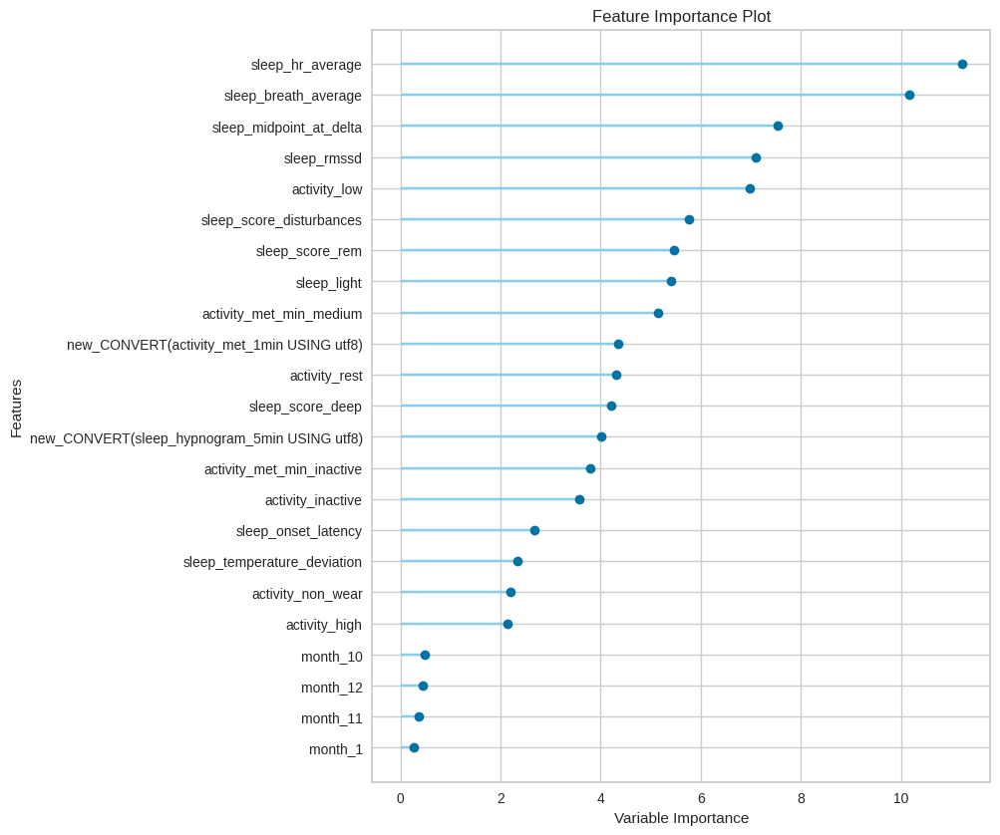

In [ ]:
plot_model(cat, plot='feature_all')  ## met

In [ ]:
test = predict_model(cat, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')

In [ ]:
sub['DIAG_NM'][0]

'CN'

In [ ]:
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

In [ ]:
for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

In [ ]:
sub['CN'] = sub['CN'] / len(diag[diag == 'CN'])
sub['MCI'] = sub['MCI'] / len(diag[diag == 'MCI'])
sub['Dem'] = sub['Dem'] / len(diag[diag == 'Dem'])

In [ ]:
for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출

In [ ]:
sub_final = sub.drop(columns =['CN','MCI','Dem'])

In [ ]:
sub_final

,ID,DIAG_NM
0,nia+075@rowan.kr,CN
1,nia+480@rowan.kr,CN
2,nia+157@rowan.kr,CN
3,nia+601@rowan.kr,CN
4,nia+194@rowan.kr,CN
...,...,...
466,nia+310@rowan.kr,CN
467,nia+226@rowan.kr,MCI
468,nia+563@rowan.kr,CN
469,nia+444@rowan.kr,CN


In [ ]:
len(sub_final[sub_final['DIAG_NM'] == 'MCI']) + len(sub_final[sub_final['DIAG_NM'] == 'Dem'])

76

In [ ]:
sub_final.to_csv('/content/predict_dropmodel_cat_drop3_add2_month_weight_plus_voting_added.csv', index=False)

In [ ]:
x_test_new = x_test_new.drop(columns = 'sleep_light_score')

In [ ]:
# 검증용
"""
stack = 0
for i in sub['DIAG_NM']:
    if i == 'CN':
        stack+=1
print(stack)

## **feature engineering 연구실**



In [ ]:
x_train_new = x_train
x_test_new = x_test

In [ ]:
x_test

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_light,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_score_deep,sleep_score_disturbances,sleep_score_rem,sleep_temperature_deviation,new_CONVERT(activity_met_1min USING utf8),sleep_rate,sleep_efficiency_rate
0,0.0,588.0,0.0,0.0,29.0,41.0,502.0,15.998712,69.541010,11047.0,26128.0,845.0,29.0,41.0,55.0,55.0,-0.346215,10.984867,0.358820,0.979062
1,0.0,544.0,309.0,6.0,0.0,163.0,601.0,13.051701,60.901762,6212.0,-9575.0,1104.0,10.0,70.0,69.0,73.0,0.019516,10.279186,0.165302,0.593357
2,2.0,559.0,236.0,12.0,154.0,14.0,439.0,13.045471,43.534256,13934.0,-5974.0,790.0,33.0,89.0,49.0,36.0,0.022043,20.456964,0.245152,0.539188
3,0.0,671.0,212.0,6.0,0.0,171.0,709.0,16.474520,64.184992,12222.0,-3392.0,447.0,19.0,95.0,74.0,100.0,0.013762,8.465007,0.397663,0.633831
4,0.0,767.0,479.0,6.0,0.0,0.0,506.0,16.299909,60.320205,7692.0,-12391.0,237.0,43.0,9.0,39.0,39.0,-0.110565,10.834972,0.108085,0.653676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29087,20.0,513.0,420.0,7.0,238.0,115.0,566.0,13.792295,65.301817,7153.0,20056.0,829.0,10.0,78.0,78.0,25.0,0.063381,324.238299,0.602025,1.750564
29088,6.0,853.0,217.0,9.0,397.0,0.0,506.0,14.549449,61.628376,11099.0,-5206.0,1612.0,29.0,100.0,62.0,70.0,-0.257062,48.853678,0.017684,0.050901
29089,12.0,705.0,152.0,1.0,299.0,0.0,360.0,12.388876,59.341031,15752.0,12054.0,90.0,14.0,71.0,49.0,50.0,0.487908,14.419136,0.235113,0.452342
29090,6.0,648.0,247.0,8.0,295.0,0.0,504.0,14.147157,42.814743,7121.0,33071.0,824.0,10.0,100.0,94.0,54.0,0.298931,155.955676,0.505349,1.539962


In [ ]:
print(np.max(x_train_org['activity_medium'] / x_train_org['activity_inactive']))
print(1/ np.mean(x_train_org['activity_medium'] / x_train_org['activity_inactive']))
print(np.median(x_train_org['activity_medium'] / x_train_org['activity_inactive']))
#x_train_org['activity_inactive']
#x_train_org['activity_low']
#_train_org['activity_medium']

2.0
8.593246496227696
0.08293838862559241


In [ ]:
# activity 관련 new feature

In [ ]:
#x_train_new = x_train_new.drop(columns = 'activity_low_rate')

In [ ]:
x_test_new.columns

Index(['activity_high', 'activity_inactive', 'activity_low',
       'sleep_efficiency_rate'],
      dtype='object')

In [ ]:
x_train_new = x_train_new.iloc[:,:-3]
x_test_new = x_test_new.iloc[:,:-2]

In [ ]:
x_train_new['sleep_rate'] = (x_train_org['sleep_deep'] + x_train_org['sleep_rem']) / (x_train_org['sleep_duration'] - x_train_org['sleep_onset_latency'])
x_test_new['sleep_rate'] = (x_test_org['sleep_deep'] + x_test_org['sleep_rem']) / (x_test_org['sleep_duration'] - x_test_org['sleep_onset_latency'])

In [ ]:
x_train_new.columns

Index(['activity_high', 'activity_inactive', 'activity_low',
       'activity_met_min_inactive', 'activity_met_min_medium',
       'activity_non_wear', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_midpoint_at_delta', 'sleep_onset_latency',
       'sleep_rmssd', 'sleep_temperature_deviation', 'diag_NM',
       'new_CONVERT(activity_met_1min USING utf8)', 'sleep_efficiency_rate',
       'sleep_rem_rate', 'sleep_deep_score', 'month'],
      dtype='object')

In [ ]:
x_test_new.columns

Index(['activity_high', 'activity_inactive', 'activity_low',
       'activity_met_min_inactive', 'activity_met_min_medium',
       'activity_non_wear', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_midpoint_at_delta', 'sleep_onset_latency',
       'sleep_rmssd', 'sleep_temperature_deviation',
       'new_CONVERT(activity_met_1min USING utf8)', 'sleep_efficiency_rate',
       'sleep_light_score', 'month'],
      dtype='object')

In [ ]:
x_train_org['activity_met_min_inactive'][x_train_org['activity_met_min_inactive'] == 0] = 0.1
x_test_org['activity_met_min_inactive'][x_test_org['activity_met_min_inactive'] == 0] = 0.1

In [ ]:
x_train_org['activity_score_recovery_time'][x_train_org['activity_score_recovery_time'] == 0] = 1
x_test_org['activity_score_recovery_time'][x_test_org['activity_score_recovery_time'] == 0] = 1

In [ ]:
x_train_new['activity_total_intensity_score_per_rest'] = x_train_org['activity_score_training_frequency'] * x_train_org['activity_score_training_volume'] / x_train_org['activity_score_recovery_time']
x_test_new['activity_total_intensity_score_per_rest'] = x_test_org['activity_score_training_frequency'] * x_test_org['activity_score_training_volume'] / x_test_org['activity_score_recovery_time']

In [ ]:
x_train_new['sleep_efficiency_rate'] = (x_train_org['sleep_rem'] + x_train_org['sleep_deep']) / (x_train_org['sleep_light'] + x_train_org['sleep_onset_latency'])
x_test_new['sleep_efficiency_rate'] = (x_test_org['sleep_rem'] + x_test_org['sleep_deep']) / (x_test_org['sleep_light'] + x_test_org['sleep_onset_latency'])

In [ ]:
x_train_new['sleep_rem_rate'] = x_train_org['sleep_rem'] / x_train_org['sleep_duration']
x_train_new['sleep_rem_rate'] = x_test_org['sleep_rem'] / x_test_org['sleep_duration']

In [ ]:
x_train_new['sleep_deep_score'] = x_train_org['sleep_score_deep'] * x_train_org['sleep_score_rem'] / x_train_org['sleep_score_latency']
x_test_new['sleep_deep_score'] = x_test_org['sleep_score_deep'] * x_test_org['sleep_score_rem'] / x_test_org['sleep_score_latency']

In [ ]:
# 회복시간 대비 운동 총 강도
x_train_new['activity_total_intensity_score_per_rest'] = x_train_org['activity_score_training_frequency'] * x_train_org['activity_score_training_volume'] / x_train_org['activity_score_recovery_time']
x_test_new['activity_total_intensity_score_per_rest'] = x_test_org['activity_score_training_frequency'] * x_test_org['activity_score_training_volume'] / x_test_org['activity_score_recovery_time']

In [ ]:
drop = ['sleep_light_rate']
x_train_new = x_train_new.drop(columns = drop)
x_test_new = x_test_new.drop(columns = drop)

In [ ]:
x_train_new = x_train_new.drop(columns = ['sleep_light','sleep_score_disturbances','sleep_score_rem','sleep_score_deep'])
x_test_new = x_test_new.drop(columns = ['sleep_light','sleep_score_disturbances','sleep_score_rem','sleep_score_deep'])

In [ ]:
exp_mclf101 = setup(data=x_train_new, target='diag_NM', session_id=123, use_gpu=True)
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8153,0.9004,0.7278,0.8147,0.8077,0.6045,0.6152,6.081
lightgbm,Light Gradient Boosting Machine,0.7941,0.8768,0.6879,0.7953,0.7824,0.5496,0.5672,0.375
rf,Random Forest Classifier,0.7681,0.8685,0.5939,0.7898,0.7405,0.4568,0.5088,1.342
et,Extra Trees Classifier,0.7451,0.8666,0.5500,0.7785,0.7064,0.3848,0.4553,1.375
gbc,Gradient Boosting Classifier,0.7204,0.7978,0.5558,0.7213,0.6849,0.3451,0.3881,6.032
dt,Decision Tree Classifier,0.6578,0.6614,0.5605,0.6610,0.6590,0.3222,0.3225,0.106
lr,Logistic Regression,0.6428,0.6121,0.3637,0.6021,0.5160,0.0318,0.0891,2.767
lda,Linear Discriminant Analysis,0.6402,0.6572,0.3964,0.5913,0.5570,0.0871,0.1238,0.044
ridge,Ridge Classifier,0.6362,0.0000,0.3434,0.5404,0.5279,0.0320,0.0588,0.019
ada,Ada Boost Classifier,0.6354,0.6359,0.4859,0.6020,0.6026,0.1786,0.1912,0.483


In [ ]:
cat = create_model('catboost')  # met
feature_importances = pd.DataFrame({'Feature': get_config('X_train').columns, 'Value': abs(
    cat.feature_importances_)}).sort_values(by='Value', ascending=False)
feature_importances
# rate + intensity

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8392,0.9204,0.7451,0.8371,0.8345,0.6615,0.6669
1,0.8300,0.9268,0.7239,0.8287,0.8243,0.6390,0.6460
2,0.8162,0.9090,0.7123,0.8165,0.8094,0.6072,0.6165
3,0.8453,0.9128,0.7879,0.8447,0.8410,0.6761,0.6825
4,0.8377,0.9116,0.7575,0.8369,0.8329,0.6584,0.6650
5,0.8377,0.9140,0.7603,0.8375,0.8339,0.6599,0.6647
6,0.8331,0.9031,0.7645,0.8380,0.8239,0.6382,0.6566
7,0.8300,0.9091,0.7407,0.8275,0.8255,0.6435,0.6482
8,0.8359,0.9073,0.7750,0.8343,0.8322,0.6563,0.6607
9,0.8344,0.9104,0.7810,0.8324,0.8291,0.6513,0.6580


,Feature,Value
8,sleep_hr_average,11.557310
7,sleep_breath_average,10.037656
9,sleep_midpoint_at_delta,8.068243
2,activity_low,7.676794
11,sleep_rmssd,7.513109
16,activity_total_intensity_score_per_rest,7.185957
6,activity_rest,5.721989
4,activity_met_min_medium,4.740414
14,new_CONVERT(sleep_hypnogram_5min USING utf8),4.581162
13,new_CONVERT(activity_met_1min USING utf8),4.398163


In [ ]:
x_train_new.corr()

,activity_high,activity_inactive,activity_low,activity_met_min_inactive,activity_met_min_medium,activity_non_wear,activity_rest,sleep_breath_average,sleep_hr_average,sleep_midpoint_at_delta,sleep_onset_latency,sleep_rmssd,sleep_temperature_deviation,new_CONVERT(activity_met_1min USING utf8),new_CONVERT(sleep_hypnogram_5min USING utf8),sleep_rate,activity_total_intensity_score_per_rest,sleep_efficiency_rate
activity_high,1.000000,-0.191574,0.100274,-0.092727,0.283385,-0.056417,-0.035672,0.049579,-0.104093,-0.029758,-0.021952,-0.006047,-0.007321,0.250372,-0.036424,0.027267,0.264684,0.034101
activity_inactive,-0.191574,1.000000,-0.449728,0.295201,-0.340243,-0.225351,-0.410417,-0.089276,0.007342,-0.074203,0.016945,0.012651,-0.029609,-0.036513,0.105044,-0.015361,-0.171061,0.016105
activity_low,0.100274,-0.449728,1.000000,0.251243,0.224053,-0.148729,-0.467437,0.132425,0.058112,-0.142505,-0.051705,-0.051482,-0.005642,-0.017073,-0.173338,0.157953,0.140321,0.122414
activity_met_min_inactive,-0.092727,0.295201,0.251243,1.000000,-0.204564,-0.144501,-0.408692,0.058483,0.047003,-0.110659,-0.068426,-0.022610,-0.005273,-0.030584,-0.116034,0.121324,-0.084591,0.111430
activity_met_min_medium,0.283385,-0.340243,0.224053,-0.204564,1.000000,-0.069004,-0.156861,-0.050711,-0.140849,-0.066549,-0.000594,0.036757,0.016013,0.027625,-0.080215,0.077310,0.397308,0.068302
activity_non_wear,-0.056417,-0.225351,-0.148729,-0.144501,-0.069004,1.000000,-0.104274,-0.008513,-0.000401,0.015905,-0.003822,-0.035780,-0.016831,0.000838,-0.001888,-0.018437,-0.053465,-0.017209
activity_rest,-0.035672,-0.410417,-0.467437,-0.408692,-0.156861,-0.104274,1.000000,-0.020714,-0.012529,0.234181,0.035180,0.042280,0.040446,0.033027,0.082649,-0.149046,-0.070605,-0.148502
sleep_breath_average,0.049579,-0.089276,0.132425,0.058483,-0.050711,-0.008513,-0.020714,1.000000,0.361864,0.007593,-0.056912,-0.170631,0.075697,0.018454,-0.035505,-0.038526,-0.036842,-0.037912
sleep_hr_average,-0.104093,0.007342,0.058112,0.047003,-0.140849,-0.000401,-0.012529,0.361864,1.000000,-0.002954,-0.021293,-0.402116,0.099356,0.001626,0.123095,-0.055620,-0.097643,-0.048413
sleep_midpoint_at_delta,-0.029758,-0.074203,-0.142505,-0.110659,-0.066549,0.015905,0.234181,0.007593,-0.002954,1.000000,0.074343,0.006067,0.080286,0.014608,0.197162,-0.170372,-0.025265,-0.122716


In [ ]:
print(x_test_new.columns)
print(x_train_new.columns)

Index(['activity_high', 'activity_inactive', 'activity_low',
       'activity_met_min_inactive', 'activity_met_min_medium',
       'activity_non_wear', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_light', 'sleep_midpoint_at_delta',
       'sleep_onset_latency', 'sleep_rmssd', 'sleep_score_deep',
       'sleep_score_disturbances', 'sleep_score_rem',
       'sleep_temperature_deviation',
       'new_CONVERT(activity_met_1min USING utf8)',
       'new_CONVERT(sleep_hypnogram_5min USING utf8)', 'month',
       'activity_total_intensity_score_per_rest'],
      dtype='object')
Index(['activity_high', 'activity_inactive', 'activity_low',
       'activity_met_min_inactive', 'activity_met_min_medium',
       'activity_non_wear', 'activity_rest', 'sleep_breath_average',
       'sleep_hr_average', 'sleep_light', 'sleep_midpoint_at_delta',
       'sleep_onset_latency', 'sleep_rmssd', 'sleep_score_deep',
       'sleep_score_disturbances', 'sleep_score_rem',
       'sle

In [ ]:
# 결과 출력 통합 코드

test = predict_model(cat, x_test)['Label']
sub = pd.read_csv('/content/sample_submission.csv')
sub['DIAG_NM'] = 0
sub['CN'] = 0
sub['MCI'] = 0
sub['Dem'] = 0

for j in range (0,len(sub['ID'])):
  for i in range (0,len(test_email)):
    if test_email[i] == sub.loc[j,'ID']:
      if test[i] == 'CN':
        sub.loc[j,'CN'] += 1
      elif test[i] == 'MCI':
        sub.loc[j,'MCI'] += 1
      else:
        sub.loc[j,'Dem'] += 1
# 2차적으로 test내의 확률값을 submit에 전달

sub['CN'] = sub['CN'] / len(diag[diag == 'CN'])
sub['MCI'] = sub['MCI'] / len(diag[diag == 'MCI'])
sub['Dem'] = sub['Dem'] / len(diag[diag == 'Dem'])

for j in range (0,len(sub['ID'])):
  if sub.loc[j,'CN'] > sub.loc[j,'MCI'] and sub.loc[j,'CN'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'CN'
  elif sub.loc[j,'MCI'] > sub.loc[j,'CN'] and sub.loc[j,'MCI'] > sub.loc[j,'Dem']:
    sub.loc[j,'DIAG_NM'] = 'MCI'
  else:
    sub.loc[j,'DIAG_NM'] = 'Dem'
# 투표결과 산출
sub_final = sub.drop(columns =['CN','MCI','Dem'])

sub_final.to_csv('/content/predict_baseline_logplus.csv', index=False)

len(sub_final[sub_final['DIAG_NM'] == 'MCI']) + len(sub_final[sub_final['DIAG_NM'] == 'Dem'])

KeyError: ignored

In [ ]:
len(sub_final[sub_final['DIAG_NM'] == 'MCI']) + len(sub_final[sub_final['DIAG_NM'] == 'Dem'])

69

In [ ]:
drop = ['sleep_temperature_deviation','activity_met_high_rate']
#'activity_high','activity_met_low_rate'
x_test_new = x_test_new.drop(columns = drop)
x_train_new = x_train_new.drop(columns = drop)

In [ ]:
exp_mclf101 = setup(data=x_train_new, target='diag_NM', session_id=123, use_gpu=True)
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8549,0.9290,0.7886,0.8563,0.8503,0.6936,0.7019,7.476
lightgbm,Light Gradient Boosting Machine,0.8208,0.9070,0.7278,0.8226,0.8124,0.6131,0.6270,0.509
rf,Random Forest Classifier,0.7907,0.8979,0.6314,0.8161,0.7675,0.5147,0.5657,1.463
et,Extra Trees Classifier,0.7656,0.8854,0.5903,0.7966,0.7346,0.4439,0.5067,1.502
gbc,Gradient Boosting Classifier,0.7400,0.8241,0.5954,0.7442,0.7109,0.3988,0.4391,7.065
dt,Decision Tree Classifier,0.6835,0.6821,0.6045,0.6845,0.6836,0.3694,0.3697,0.130
lr,Logistic Regression,0.6455,0.6382,0.4042,0.5800,0.5336,0.0686,0.1303,3.309
lda,Linear Discriminant Analysis,0.6425,0.6699,0.4338,0.5939,0.5716,0.1211,0.1551,0.058
ridge,Ridge Classifier,0.6389,0.0000,0.3563,0.5806,0.5391,0.0519,0.0851,0.047
ada,Ada Boost Classifier,0.6308,0.6397,0.4958,0.6020,0.6039,0.1831,0.1929,0.573


In [ ]:
cat = create_model('catboost')  # met
feature_importances = pd.DataFrame({'Feature': get_config('X_train').columns, 'Value': abs(
    cat.feature_importances_)}).sort_values(by='Value', ascending=False)
feature_importances

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8591,0.9334,0.7844,0.8579,0.8562,0.7069,0.7100
1,0.8484,0.9367,0.7597,0.8516,0.8428,0.6749,0.6860
2,0.8361,0.9238,0.7435,0.8360,0.8309,0.6532,0.6607
3,0.8637,0.9283,0.8211,0.8641,0.8599,0.7161,0.7225
4,0.8530,0.9254,0.7768,0.8536,0.8490,0.6908,0.6970
5,0.8622,0.9307,0.8100,0.8631,0.8592,0.7119,0.7170
6,0.8423,0.9185,0.7901,0.8487,0.8335,0.6586,0.6779
7,0.8530,0.9314,0.7764,0.8528,0.8489,0.6911,0.6976
8,0.8635,0.9289,0.7961,0.8671,0.8585,0.7088,0.7200
9,0.8681,0.9326,0.8285,0.8685,0.8641,0.7232,0.7300


,Feature,Value
5,sleep_hr_average,11.997693
4,sleep_breath_average,9.758186
7,sleep_midpoint_at_delta,7.315856
9,sleep_rmssd,6.453322
16,activity_total_intensity_score_per_rest,6.309554
15,activity_low_rate,6.203934
12,sleep_score_rem,5.701194
11,sleep_score_disturbances,5.430205
6,sleep_light,5.209754
17,activity_met_medium_rate,4.585708
